In [46]:
import torch
import cv2
from ultralytics import YOLO
import torch
from torchvision import transforms
from matplotlib import pyplot as plt
from matplotlib.patches import Rectangle
from PIL import Image
import numpy as np
import os
import matplotlib.gridspec as gridspec

In [4]:
model = YOLO("SGD128_0001_0/weights/best.pt")

In [3]:
device = torch.device("cuda:0")
print(device)

cuda:0


Image

In [5]:
img = cv2.imread("frame.jpg")
img = img/255
img = transforms.ToTensor()(img)
img = img.unsqueeze(0)
img = img.to(device=device, dtype=torch.float)

Check image

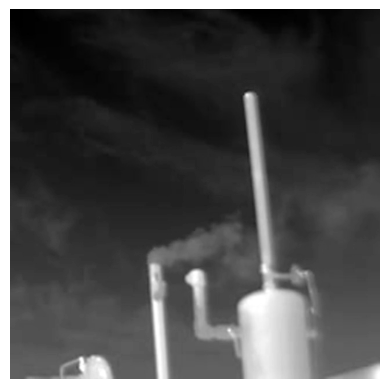

In [9]:
plt.imshow(img[0][0].cpu().detach().numpy(),cmap='gray')
plt.axis('off')
plt.show()

Load weight model

In [ ]:
conv_weights = []  # List to store convolutional layer weights
conv_layers = []  # List to store convolutional layers
total_conv_layers = 0  # Counter for total convolutional layers
Bias = []
for name, layer in model.named_modules():
    print(name)
    # print(layer)
    if isinstance(layer, torch.nn.Conv2d):
        # Access the weights and biases of each convolutional layer
        weights = layer.weight
        biases = layer.bias
        # print(weights)
        # print(biases)
        total_conv_layers += 1
        conv_weights.append(layer.weight)
        conv_layers.append(layer)
        Bias.append(layer.bias)
print(f"Total convolution layers: {total_conv_layers}")

Visualize feature map

In [23]:
def hook_fn(module, input, output):
    intermediate_features.append(output)

# Define feature extraction function
def extract_features(model, img, layer_index=20): ##Choose the layer that fit your application
    global intermediate_features
    intermediate_features = []
    hook = model.model.model[layer_index].register_forward_hook(hook_fn)
    print(hook)
    with torch.no_grad():
        model(img)
    hook.remove()
    return intermediate_features[0]  # Access the first element of the list


0: 640x640 2 Leaks, 158.0ms
Speed: 0.0ms preprocess, 158.0ms inference, 5.0ms postprocess per image at shape (1, 3, 640, 640)


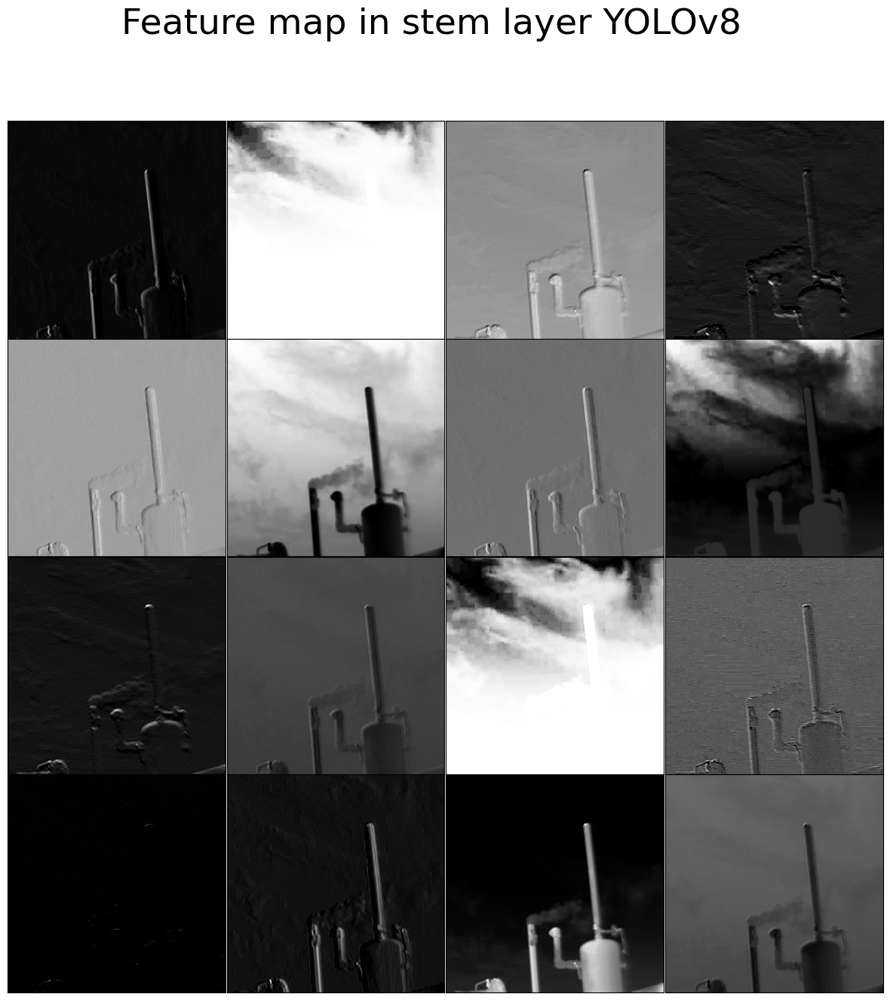

In [63]:
fm = extract_features(model,img,layer_index=0)
fig = plt.figure(figsize=(15, 15))  
gs = gridspec.GridSpec(4, 4, wspace=0.001, hspace=0.001)
t = 0

for i in range(fm[0].shape[0]//4):
    for j in range(fm[0].shape[0]//4):
        axs = fig.add_subplot(gs[i, j])
        axs.imshow(fm[0][t].cpu().numpy(),cmap='gray')
        axs.set_xticks([])
        axs.set_yticks([])
        t +=1
        
fig.suptitle('Feature map in stem layer YOLOv8',fontsize=34)
plt.show()


0: 640x640 2 Leaks, 211.5ms
Speed: 0.0ms preprocess, 211.5ms inference, 5.0ms postprocess per image at shape (1, 3, 640, 640)


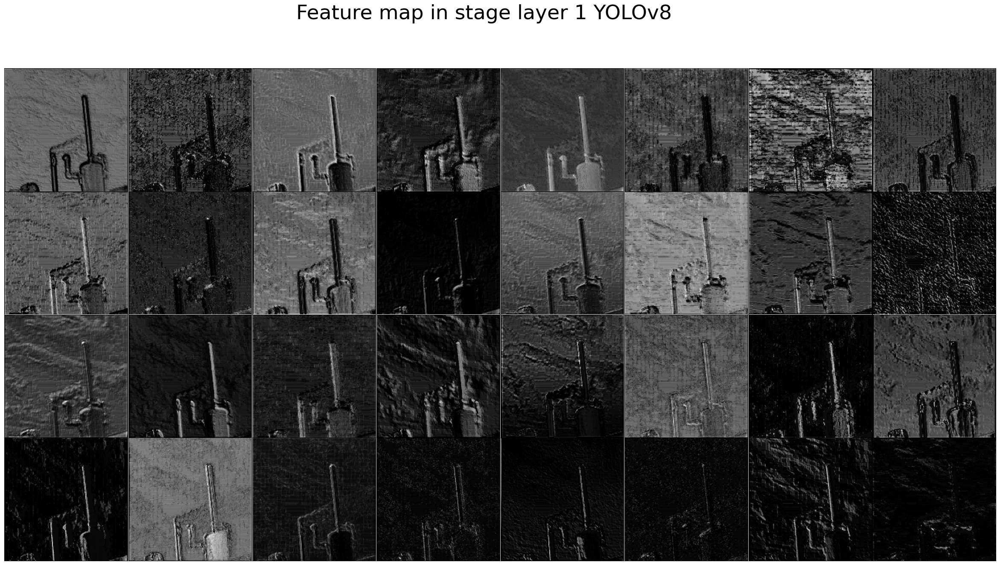

In [65]:
fm = extract_features(model,img,layer_index=2)
fig = plt.figure(figsize=(30, 15)) 
gs = gridspec.GridSpec(4,8, wspace=0, hspace=0)
t = 0
for i in range(4):
    for j in range(8):
        axs = fig.add_subplot(gs[i, j])
        axs.imshow(fm[0][t].cpu().numpy(),cmap='gray')
        axs.set_xticks([])
        axs.set_yticks([])
        t +=1
        
fig.suptitle('Feature map in stage layer 1 YOLOv8',fontsize=34)
plt.show()


0: 640x640 2 Leaks, 88.2ms
Speed: 0.0ms preprocess, 88.2ms inference, 6.0ms postprocess per image at shape (1, 3, 640, 640)


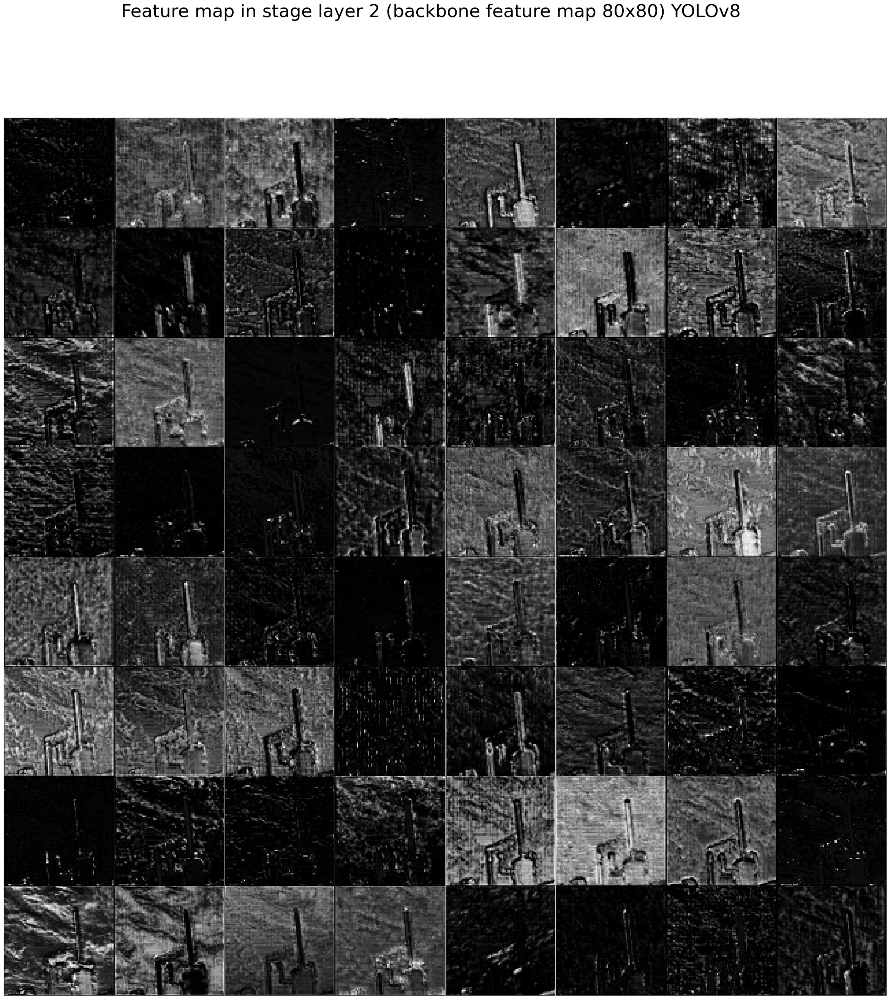

In [73]:
fm = extract_features(model,img,layer_index=4)
fig = plt.figure(figsize=(30, 30)) 
gs = gridspec.GridSpec(8,8, wspace=0, hspace=0)
t = 0
for i in range(8):
    for j in range(8):
        axs = fig.add_subplot(gs[i, j])
        axs.imshow(fm[0][t].cpu().numpy(),cmap='gray')
        axs.set_xticks([])
        axs.set_yticks([])
        t +=1
        
fig.suptitle('Feature map in stage layer 2 (backbone feature map 80x80) YOLOv8',fontsize=34)
plt.show()

In [68]:
8*16

128


0: 640x640 2 Leaks, 167.6ms
Speed: 0.0ms preprocess, 167.6ms inference, 10.0ms postprocess per image at shape (1, 3, 640, 640)


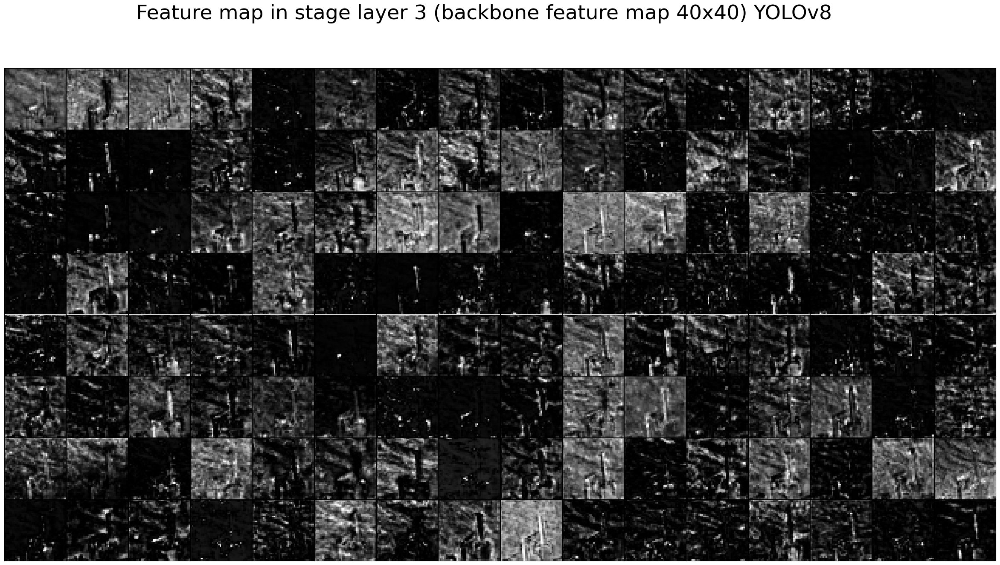

In [75]:
fm = extract_features(model,img,layer_index=6)
fig = plt.figure(figsize=(30, 15)) 
gs = gridspec.GridSpec(8,16, wspace=0, hspace=0)
t = 0
for i in range(8):
    for j in range(16):
        axs = fig.add_subplot(gs[i, j])
        axs.imshow(fm[0][t].cpu().numpy(),cmap='gray')
        axs.set_xticks([])
        axs.set_yticks([])
        t +=1
        
fig.suptitle('Feature map in stage layer 3 (backbone feature map 40x40) YOLOv8',fontsize=34)
plt.show()


0: 640x640 2 Leaks, 48.9ms
Speed: 0.0ms preprocess, 48.9ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)


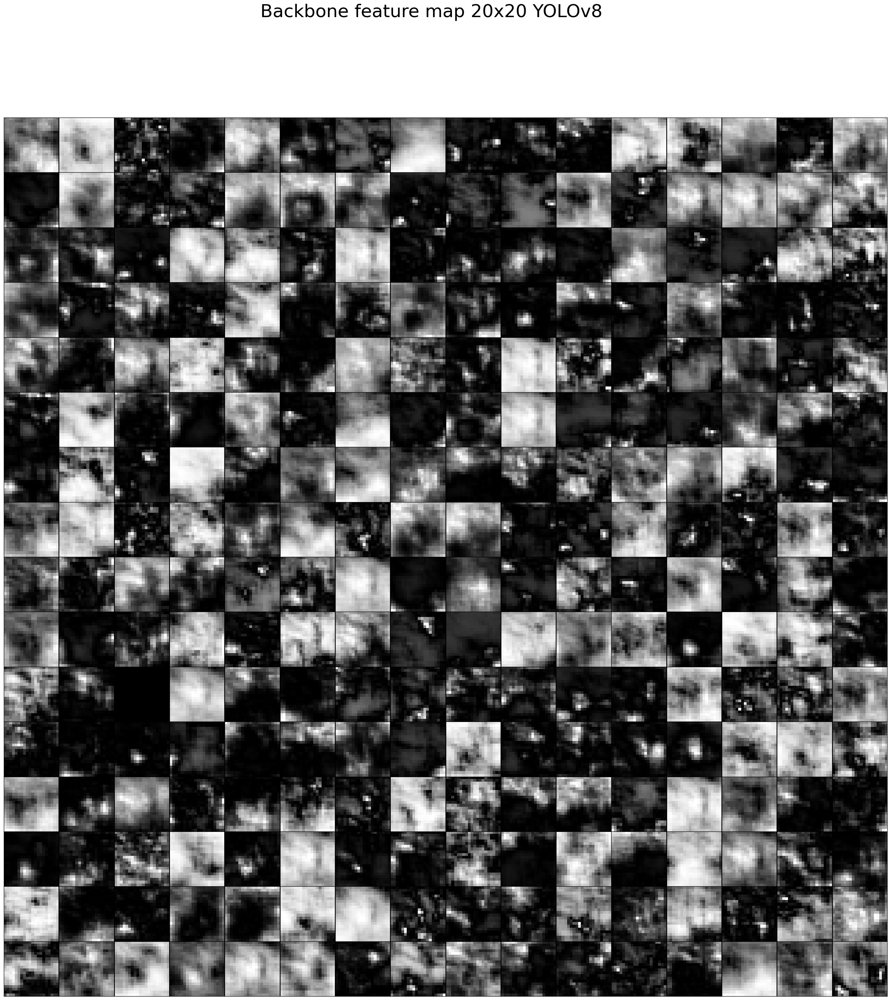

In [76]:
fm = extract_features(model,img,layer_index=10)
fig = plt.figure(figsize=(30, 30)) 
gs = gridspec.GridSpec(16,16, wspace=0, hspace=0)
t = 0
for i in range(16):
    for j in range(16):
        axs = fig.add_subplot(gs[i, j])
        axs.imshow(fm[0][t].cpu().numpy(),cmap='gray')
        axs.set_xticks([])
        axs.set_yticks([])
        t +=1
        
fig.suptitle('Backbone feature map 20x20 YOLOv8',fontsize=34)
plt.show()


0: 640x640 2 Leaks, 44.6ms
Speed: 0.5ms preprocess, 44.6ms inference, 6.5ms postprocess per image at shape (1, 3, 640, 640)


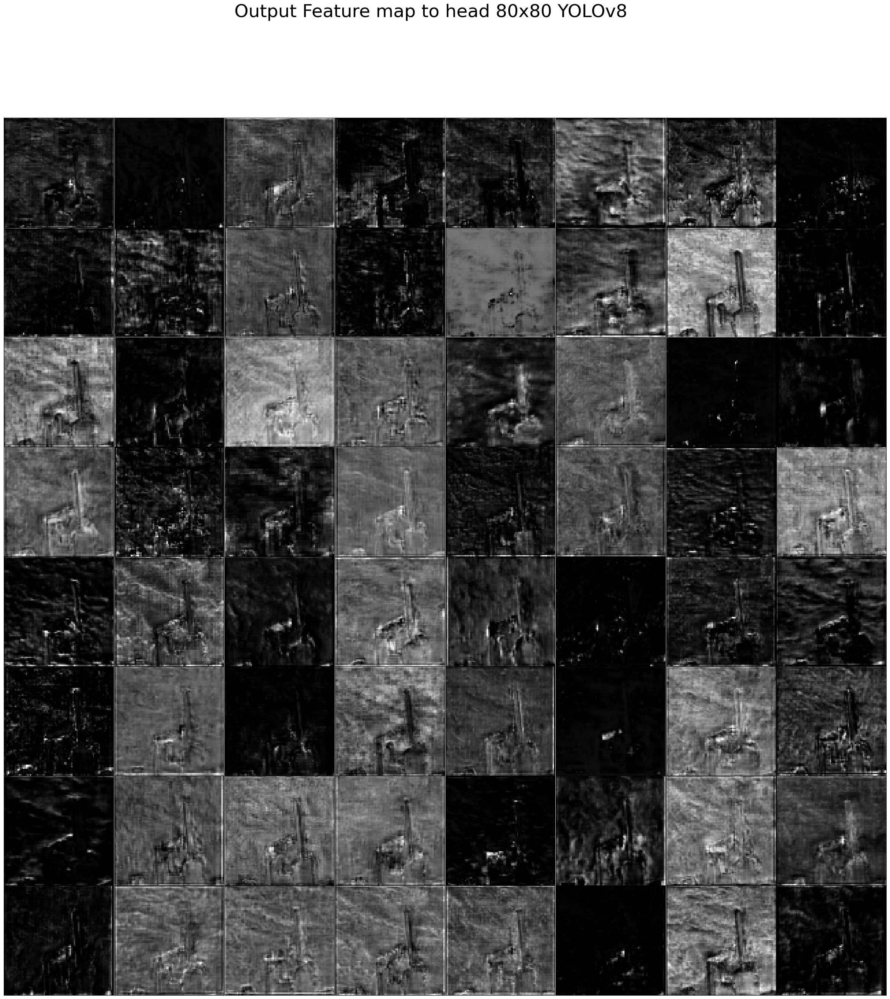

In [77]:
fm = extract_features(model,img,layer_index=15)
fig = plt.figure(figsize=(30, 30)) 
gs = gridspec.GridSpec(8,8, wspace=0, hspace=0)
t = 0
for i in range(8):
    for j in range(8):
        axs = fig.add_subplot(gs[i, j])
        axs.imshow(fm[0][t].cpu().numpy(),cmap='gray')
        axs.set_xticks([])
        axs.set_yticks([])
        t +=1
        
fig.suptitle('Output Feature map to head 80x80 YOLOv8',fontsize=34)
plt.show()


0: 640x640 2 Leaks, 145.7ms
Speed: 0.0ms preprocess, 145.7ms inference, 5.3ms postprocess per image at shape (1, 3, 640, 640)


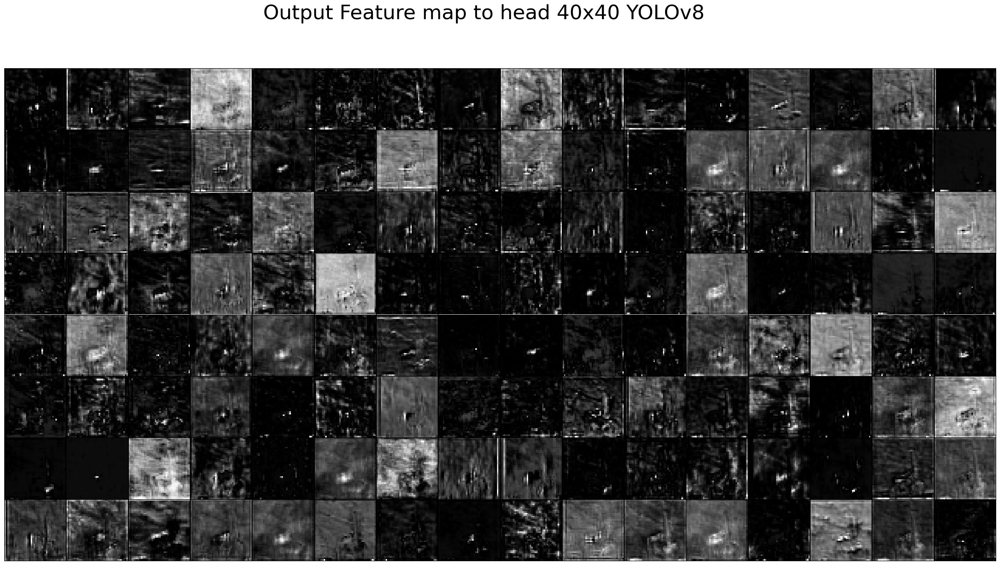

In [79]:
fm = extract_features(model,img,layer_index=18)
fig = plt.figure(figsize=(30, 15)) 
gs = gridspec.GridSpec(8,16, wspace=0, hspace=0)
t = 0
for i in range(8):
    for j in range(16):
        axs = fig.add_subplot(gs[i, j])
        axs.imshow(fm[0][t].cpu().numpy(),cmap='gray')
        axs.set_xticks([])
        axs.set_yticks([])
        t +=1
        
fig.suptitle('Output Feature map to head 40x40 YOLOv8',fontsize=34)
plt.show()


0: 640x640 2 Leaks, 39.9ms
Speed: 0.0ms preprocess, 39.9ms inference, 3.9ms postprocess per image at shape (1, 3, 640, 640)


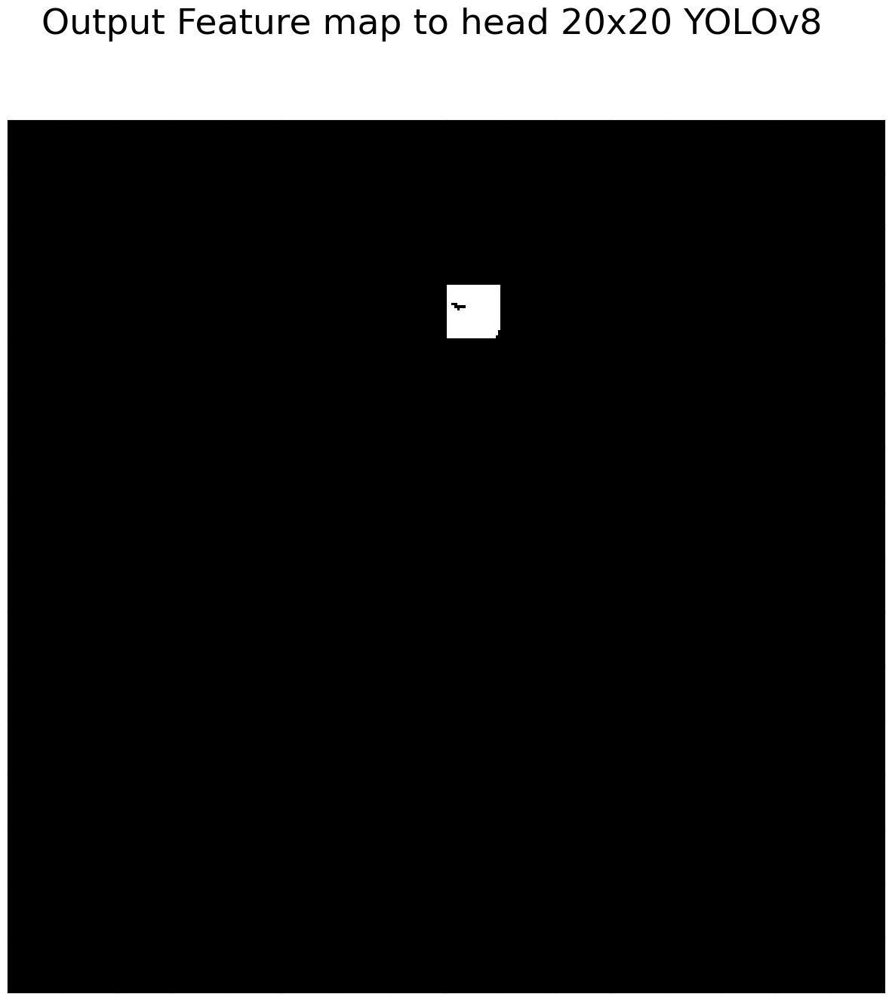

In [81]:
fm = extract_features(model,img,layer_index=21)
fig = plt.figure(figsize=(15, 15)) 
gs = gridspec.GridSpec(16,16, wspace=0, hspace=0)
t = 0
for i in range(16):
    for j in range(16):
        axs = fig.add_subplot(gs[i, j])
        axs.imshow(fm[0][t].cpu().numpy(),cmap='gray')
        axs.set_xticks([])
        axs.set_yticks([])
        t +=1
        
fig.suptitle('Output Feature map to head 20x20 YOLOv8',fontsize=34)
plt.show()


0: 640x640 2 Leaks, 40.9ms
Speed: 0.0ms preprocess, 40.9ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)
torch.Size([1, 64, 80, 80])


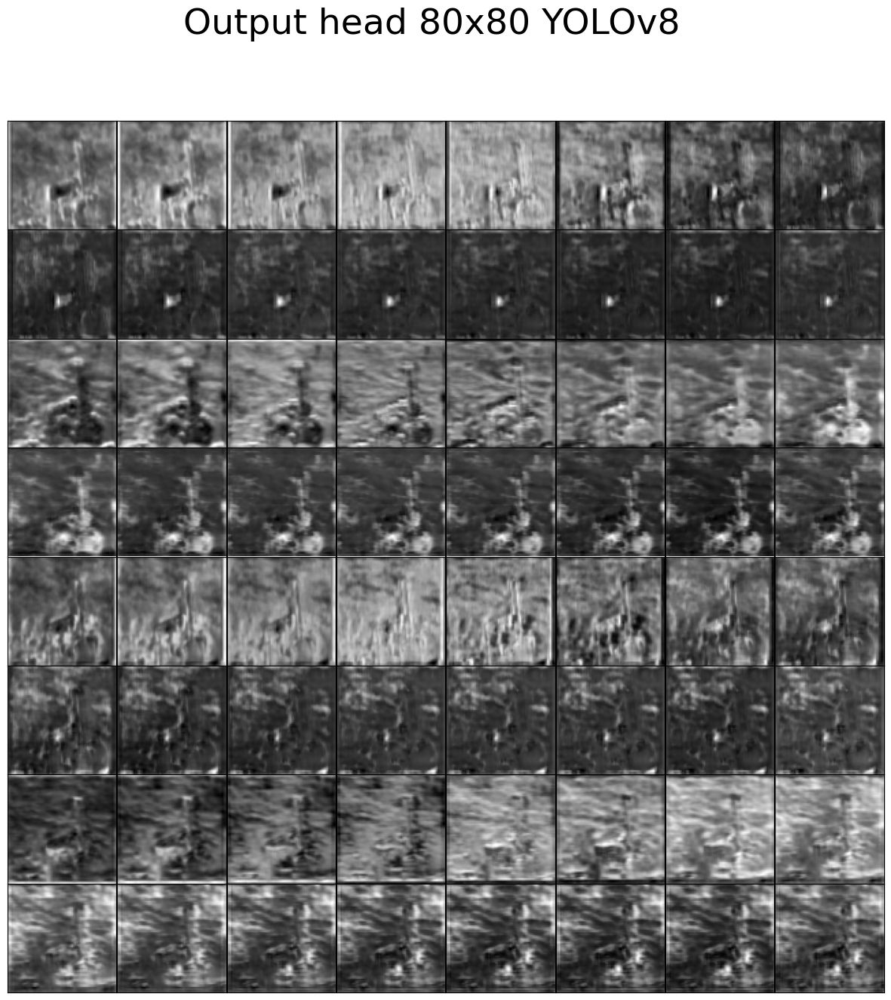

In [84]:
o = model.model.model[22].cv2[0][0](extract_features(model,img,layer_index=15))
o1 = model.model.model[22].cv2[0][1](o)
o2 = model.model.model[22].cv2[0][2](o1)
print(o2.shape)
fig = plt.figure(figsize=(15, 15)) 
gs = gridspec.GridSpec(8,8, wspace=0, hspace=0)
t = 0
for i in range(8):
    for j in range(8):
        axs = fig.add_subplot(gs[i, j])
        axs.imshow(o2[0][t].cpu().numpy(),cmap='gray')
        axs.set_xticks([])
        axs.set_yticks([])
        t +=1
        
fig.suptitle('Output head 80x80 YOLOv8',fontsize=34)
plt.show()


0: 640x640 2 Leaks, 224.5ms
Speed: 0.0ms preprocess, 224.5ms inference, 6.0ms postprocess per image at shape (1, 3, 640, 640)
torch.Size([1, 64, 40, 40])


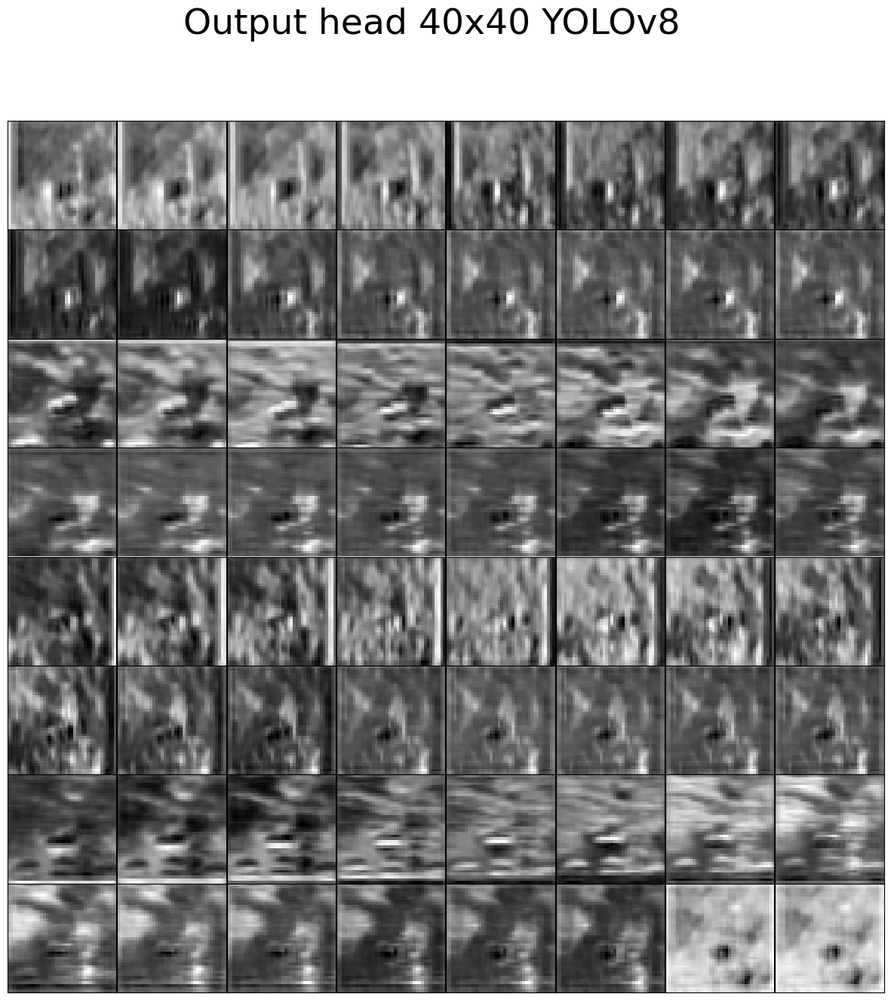

In [87]:
o = model.model.model[22].cv2[1][0](extract_features(model,img,layer_index=18))
o1 = model.model.model[22].cv2[1][1](o)
o2 = model.model.model[22].cv2[1][2](o1)
print(o2.shape)
fig = plt.figure(figsize=(15, 15)) 
gs = gridspec.GridSpec(8,8, wspace=0, hspace=0)
t = 0
for i in range(8):
    for j in range(8):
        axs = fig.add_subplot(gs[i, j])
        axs.imshow(o2[0][t].cpu().numpy(),cmap='gray')
        axs.set_xticks([])
        axs.set_yticks([])
        t +=1
        
fig.suptitle('Output head 40x40 YOLOv8',fontsize=34)
plt.show()


0: 640x640 2 Leaks, 229.6ms
Speed: 0.0ms preprocess, 229.6ms inference, 5.0ms postprocess per image at shape (1, 3, 640, 640)
torch.Size([1, 64, 20, 20])


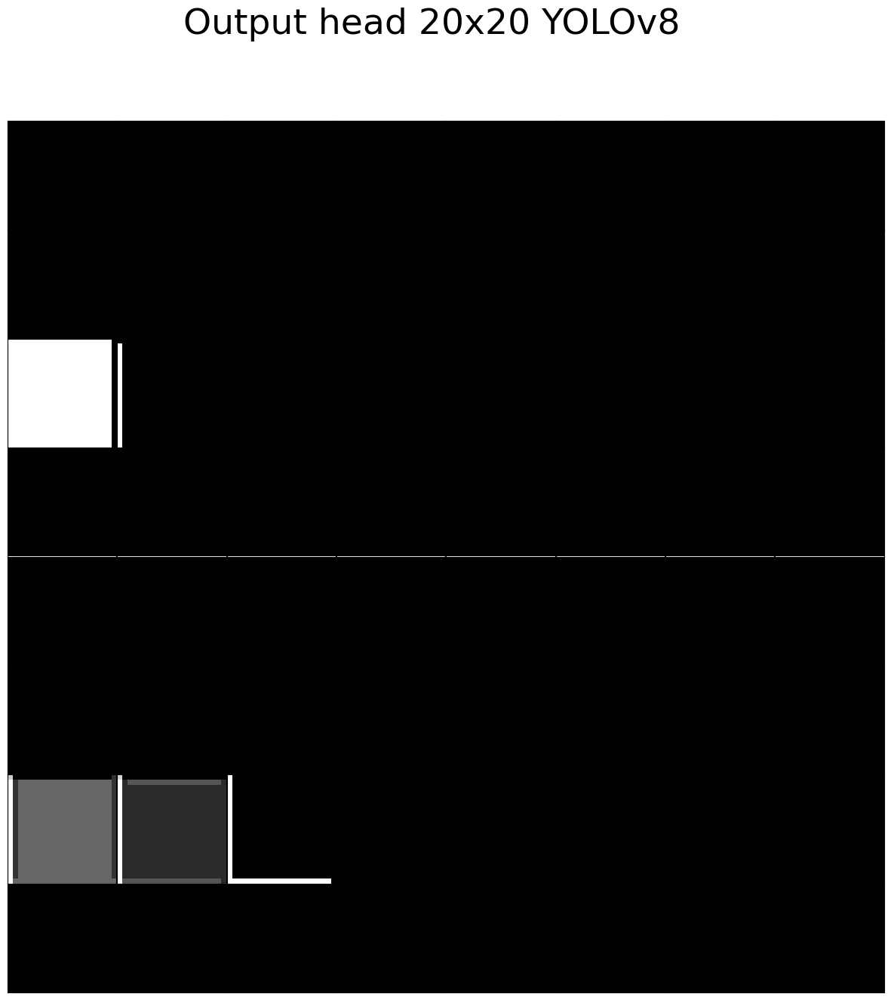

In [89]:
o = model.model.model[22].cv2[2][0](extract_features(model,img,layer_index=21))
o1 = model.model.model[22].cv2[2][1](o)
o2 = model.model.model[22].cv2[2][2](o1)
print(o2.shape)
fig = plt.figure(figsize=(15, 15)) 
gs = gridspec.GridSpec(8,8, wspace=0, hspace=0)
t = 0
for i in range(8):
    for j in range(8):
        axs = fig.add_subplot(gs[i, j])
        axs.imshow(o2[0][t].cpu().numpy(),cmap='gray')
        axs.set_xticks([])
        axs.set_yticks([])
        t +=1
        
fig.suptitle('Output head 20x20 YOLOv8',fontsize=34)
plt.show()


0: 640x640 2 Leaks, 44.4ms
Speed: 0.0ms preprocess, 44.4ms inference, 6.0ms postprocess per image at shape (1, 3, 640, 640)


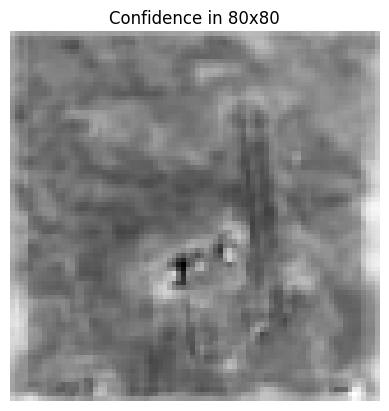

In [95]:
o = model.model.model[22].cv3[0][0](extract_features(model,img,layer_index=15))
o1 = model.model.model[22].cv3[0][1](o)
o2 = model.model.model[22].cv3[0][2](o1)
plt.imshow(o2[0][0].cpu().numpy(),cmap='gray')
plt.axis('off')
plt.title('Confidence in 80x80')
plt.show()


0: 640x640 2 Leaks, 267.2ms
Speed: 0.0ms preprocess, 267.2ms inference, 6.7ms postprocess per image at shape (1, 3, 640, 640)


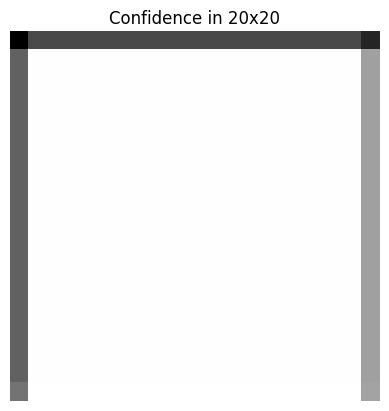

In [97]:
o = model.model.model[22].cv3[2][0](extract_features(model,img,layer_index=21))
o1 = model.model.model[22].cv3[2][1](o)
o2 = model.model.model[22].cv3[2][2](o1)
plt.imshow(o2[0][0].cpu().numpy(),cmap='gray')
plt.axis('off')
plt.title('Confidence in 20x20')
plt.show()

Confidence heatmap with sigmoid


0: 640x640 2 Leaks, 276.2ms
Speed: 0.5ms preprocess, 276.2ms inference, 5.5ms postprocess per image at shape (1, 3, 640, 640)


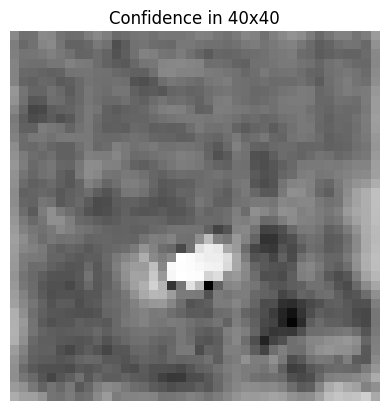

In [127]:
o = model.model.model[22].cv3[1][0](extract_features(model,img,layer_index=18))
o1 = model.model.model[22].cv3[1][1](o)
o2 = model.model.model[22].cv3[1][2](o1)
plt.imshow(o2[0][0].cpu().numpy(),cmap='gray')
plt.axis('off')
plt.title('Confidence in 40x40')
plt.show()
clssss = torch.sigmoid(o2)

In [116]:
sigmo.shape

(640, 640)

<function matplotlib.pyplot.show(close=None, block=None)>

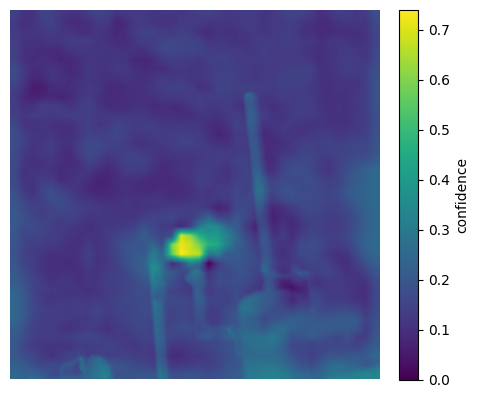

In [140]:
def scalefactor(blended,sigmo):
    min_A = blended.min()
    max_A = blended.max()

    min_range = 0
    max_range = sigmo.max()
    # Menghitung faktor scaling
    scale_factor = (max_range - min_range) / (max_A - min_A)
    blended = min_range + (blended - min_A) * scale_factor
    return blended

sigmo = cv2.resize(clssss[0][0].cpu().numpy(), (640, 640), 
            interpolation = cv2.INTER_LINEAR_EXACT)
stretch_near = cv2.resize(o2[0][0].cpu().numpy(), (640, 640), 
            interpolation = cv2.INTER_LINEAR_EXACT)
blended = scalefactor(scalefactor(img[0][0].cpu().numpy()*20 + stretch_near,sigmo) + sigmo,sigmo)


#visualize
fig, ax = plt.subplots()
cax = plt.imshow(blended)
plt.axis('off')
cbar = fig.colorbar(cax, ax=ax, orientation='vertical', fraction=0.046, pad=0.04)
cbar.set_label('confidence')
plt.show

In [149]:
detect = extract_features(model, img, layer_index=22)
print(f'index:{np.where(detect[0][0][4].cpu() == detect[0][0][4].cpu().max())[0][0]}, conf: {detect[0][0][4][np.where(detect[0][0][4].cpu() == detect[0][0][4].cpu().max())[0][0]]}')
x = detect[0][0][0]
boxxx = detect[0][0][:-1]
boxxx=boxxx.reshape(1,4,8400)


0: 640x640 2 Leaks, 80.1ms
Speed: 0.0ms preprocess, 80.1ms inference, 8.6ms postprocess per image at shape (1, 3, 640, 640)
index:7458, conf: 0.7435892224311829


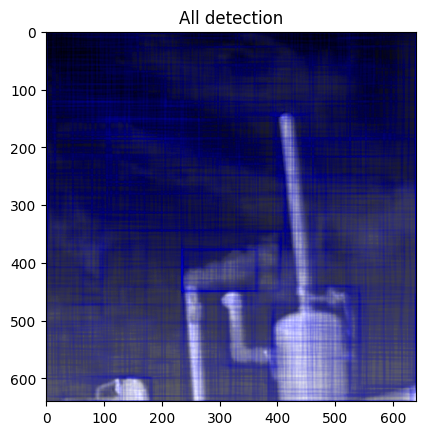

In [154]:
# Display the image
plt.imshow(img[0][0].cpu().numpy(),cmap='gray')

# Get the current reference
ax = plt.gca()
# Create a Rectangle patch
gt = Rectangle((231, 378),138,68,linewidth=1.5,ls='-',edgecolor='r',facecolor='none')

for j in range(0,8400):       
    x1 = boxxx[0][0][j].detach().cpu().numpy()
    y1 = boxxx[0][1][j].detach().cpu().numpy()
    x2 = boxxx[0][2][j].detach().cpu().numpy()
    y2 = boxxx[0][3][j].detach().cpu().numpy()
    H = max(x1,x2) - min(x1,x2)
    W = max(y1,y2) - min(y1,y2)
    x = min(x1,x2)
    y = min(y1,y2)
    
    if j == 7458:
        rect = Rectangle((x, y),H,W,linewidth=0.1,edgecolor='b',facecolor='none')
    else:
        rect = Rectangle((x, y),H,W,linewidth=0.02,edgecolor='b',facecolor='none')
    
    # Add the patch to the Axes
    ax.add_patch(rect)
    plt.title('All detection')


Text(0.5, 1.0, 'detections that have confidence values')

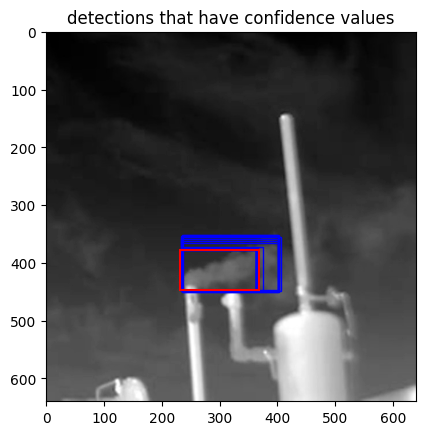

In [160]:
plt.imshow(img[0][0].cpu().numpy(),cmap='gray')

# Get the current reference
ax = plt.gca()
# Create a Rectangle patch
gt = Rectangle((231, 378),138,68,linewidth=1.5,ls='-',edgecolor='r',facecolor='none')

for j in range(0,8400):     
    if detect[0][0][4][j] > 0.01:
        x1 = boxxx[0][0][j].detach().cpu().numpy()
        y1 = boxxx[0][1][j].detach().cpu().numpy()
        x2 = boxxx[0][2][j].detach().cpu().numpy()
        y2 = boxxx[0][3][j].detach().cpu().numpy()
        H = max(x1,x2) - min(x1,x2)
        W = max(y1,y2) - min(y1,y2)
        x = min(x1,x2)
        y = min(y1,y2)
        rect = Rectangle((x, y),H,W,linewidth=1,edgecolor='b',facecolor='none')
        ax.add_patch(rect)
    # else:
        # rect = Rectangle((x, y),H,W,linewidth=0.02,edgecolor='b',facecolor='none')
    
    # Add the patch to the Axes
    

ax.add_patch(gt)
plt.title('detections that have confidence values')


0: 640x640 1 Leak, 245.4ms
Speed: 0.5ms preprocess, 245.4ms inference, 42.1ms postprocess per image at shape (1, 3, 640, 640)


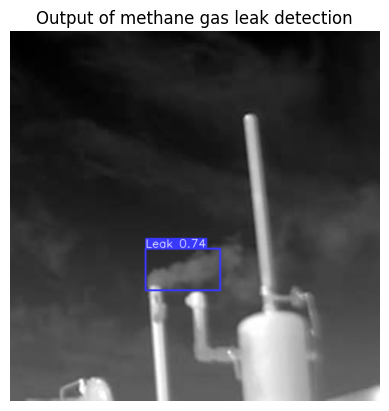

In [159]:
output = model(img, conf=0.5)
annotated_frame = output[0].plot()
plt.imshow(annotated_frame)
plt.axis('off')
plt.title('Output of methane gas leak detection')
plt.show()